[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Yusuke710/ROSO/blob/main/roso/ROSO_UnseenBackground.ipynb)

In [ ]:
import torch
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


You can move your own generated file from cliport/demo.py or already generated data in https://drive.google.com/drive/folders/1teo0r8G2c9SX0zu9gNhidOgKWESlK8QZ?usp=drive_link

## Parameters

In [ ]:
# metadata from CLIPort pipeline
metadata_path = '/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/metadata.csv'

# raw_images on the drive
raw_images_dir = '/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/raw_images'

# directory to store edited images
store_dir = '/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images'

In [ ]:
# model parameters

# detection param
box_threshold = 0.2
text_threshold = 0.2

# num_inference_steps
num_inference_steps = 20
# strength
strength = 1 # how much to transform the reference image. 1 means ignoring the image being replaced

# number of image to generate using SD
num_to_generate = 3

# seed
seed = 42

## Install

In [ ]:
%cd /content

# GSAM
!git clone https://github.com/IDEA-Research/Grounded-Segment-Anything

%cd /content/Grounded-Segment-Anything
!pip install -q -r requirements.txt
%cd /content/Grounded-Segment-Anything/GroundingDINO
!pip install -q .
%cd /content/Grounded-Segment-Anything/segment_anything
!pip install -q .
%cd /content/Grounded-Segment-Anything

/content
fatal: destination path 'Grounded-Segment-Anything' already exists and is not an empty directory.
/content/Grounded-Segment-Anything
/content/Grounded-Segment-Anything/GroundingDINO
  Preparing metadata (setup.py) ... done
/content/Grounded-Segment-Anything/segment_anything
  Preparing metadata (setup.py) ... done
/content/Grounded-Segment-Anything


In [ ]:
# SDXL
!pip install transformers
!pip install accelerate
!pip install safetensors
!pip install diffusers

## Imports

In [ ]:
import os, sys

sys.path.append(os.path.join(os.getcwd(), "GroundingDINO"))

import argparse
import copy
import pandas as pd

from IPython.display import display
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert

# Grounding DINO
import GroundingDINO.groundingdino.datasets.transforms as T
from GroundingDINO.groundingdino.models import build_model
from GroundingDINO.groundingdino.util import box_ops
from GroundingDINO.groundingdino.util.slconfig import SLConfig
from GroundingDINO.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap
from GroundingDINO.groundingdino.util.inference import annotate, load_image, predict

import supervision as sv

# segment anything
from segment_anything import build_sam, SamPredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt


# diffusers
import random
from diffusers import StableDiffusionXLInpaintPipeline


from huggingface_hub import hf_hub_download

## Load models

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
!nvidia-smi

Sun Nov 19 06:02:29 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P0    31W /  70W |   8997MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Grounding DINO model

In [ ]:
def load_model_hf(repo_id, filename, ckpt_config_filename, device='cpu'):
    cache_config_file = hf_hub_download(repo_id=repo_id, filename=ckpt_config_filename)

    args = SLConfig.fromfile(cache_config_file)
    args.device = device
    model = build_model(args)

    cache_file = hf_hub_download(repo_id=repo_id, filename=filename)
    checkpoint = torch.load(cache_file, map_location=device)
    log = model.load_state_dict(clean_state_dict(checkpoint['model']), strict=False)
    print("Model loaded from {} \n => {}".format(cache_file, log))
    _ = model.eval()
    return model

In [ ]:
ckpt_repo_id = "ShilongLiu/GroundingDINO"
ckpt_filenmae = "groundingdino_swinb_cogcoor.pth"
ckpt_config_filename = "GroundingDINO_SwinB.cfg.py"


groundingdino_model = load_model_hf(ckpt_repo_id, ckpt_filenmae, ckpt_config_filename, device)

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


### SAM

In [ ]:
! wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

sam_checkpoint = 'sam_vit_h_4b8939.pth'

sam_predictor = SamPredictor(build_sam(checkpoint=sam_checkpoint).to(device))

--2023-11-19 06:02:41--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 52.84.251.27, 52.84.251.114, 52.84.251.106, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|52.84.251.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth.2’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G  75.3MB/s    in 31s     

2023-11-19 06:03:12 (78.8 MB/s) - ‘sam_vit_h_4b8939.pth.2’ saved [2564550879/2564550879]



## Inference utils

In [ ]:
# @title Grounding DINO for detection
# detect object using grounding DINO
def detect_multiple(image, image_source, text_prompt, model, box_threshold = box_threshold, text_threshold = text_threshold):
  boxes, logits, phrases = predict(
      model=model,
      image=image,
      caption=text_prompt,
      box_threshold=box_threshold,
      text_threshold=text_threshold
  )

  annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
  annotated_frame = annotated_frame[...,::-1] # BGR to RGB
  return annotated_frame, boxes

  def detect(image, image_source, text_prompt, model, box_threshold=box_threshold, text_threshold=text_threshold):
    boxes, logits, phrases = predict(
        model=model,
        image=image,
        caption=text_prompt,
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )

    if logits.numel() == 0:
        print("Logits tensor is empty or contains no valid values.")
        return None, None

    highest_prob_index = logits.argmax()
    highest_prob_box = boxes[highest_prob_index].unsqueeze(0)
    highest_prob_logits = logits[highest_prob_index].unsqueeze(0)

    annotated_frame_with_highest_prob_box = image_source.copy()
    annotated_frame_with_highest_prob_box = annotate(image_source=annotated_frame_with_highest_prob_box, boxes=highest_prob_box, logits=highest_prob_logits, phrases=[phrases[highest_prob_index]])
    annotated_frame_with_highest_prob_box = annotated_frame_with_highest_prob_box[...,::-1]  # BGR to RGB

    return annotated_frame_with_highest_prob_box, highest_prob_box


### SAM for segmentation

In [ ]:
# @title SAM for segmentation
def segment(image, sam_model, boxes):
  sam_model.set_image(image)
  H, W, _ = image.shape
  boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])

  transformed_boxes = sam_model.transform.apply_boxes_torch(boxes_xyxy.to(device), image.shape[:2])
  masks, _, _ = sam_model.predict_torch(
      point_coords = None,
      point_labels = None,
      boxes = transformed_boxes,
      multimask_output = False,
      )
  return masks.cpu()


def draw_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

def merge_masks(masks):
    merged_mask = np.zeros_like(masks[0][0])
    for i in range(len(masks)):
        merged_mask = np.logical_or(merged_mask, masks[i][0].cpu().numpy())
    return merged_mask


# Function to convert normalized coordinates to pixel coordinates
def normalized_to_pixel_coordinates(normalized_box, image_width, image_height):
    x_min, y_min, width, height = normalized_box

    # adjust the point from the centre of the boundary to the left top corner
    x_min = x_min - width/2
    y_min = y_min - height/2

    # convert to pixel space
    x_min_pixel = int(x_min * image_width)
    y_min_pixel = int(y_min * image_height)
    x_max_pixel = int((x_min + width) * image_width)
    y_max_pixel = int((y_min + height) * image_height)

    #print(f'integer: {x_min_pixel}, {y_min_pixel}, {x_max_pixel}, {y_max_pixel}')


    return x_min_pixel, y_min_pixel, x_max_pixel, y_max_pixel


# extract bounding box to inpaint
def get_image_inside_boundingbox(image_source, box): # could be mask image
  x_min, y_min, x_max, y_max = box
  image_inside_boundingbox = image_source[y_min:y_max, x_min:x_max]
  return image_inside_boundingbox

## Inference on a multiple images

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


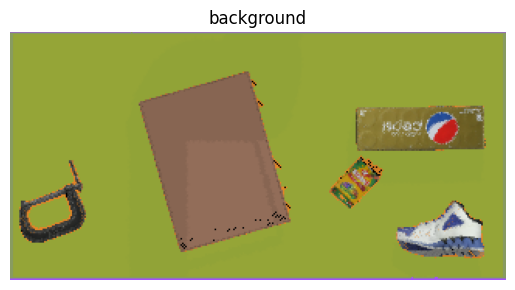

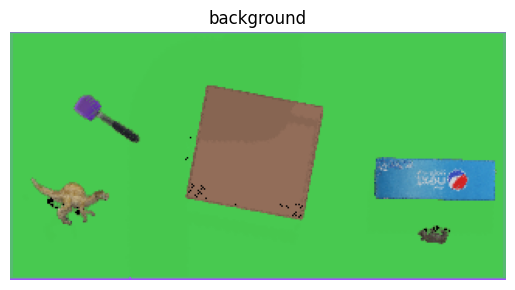

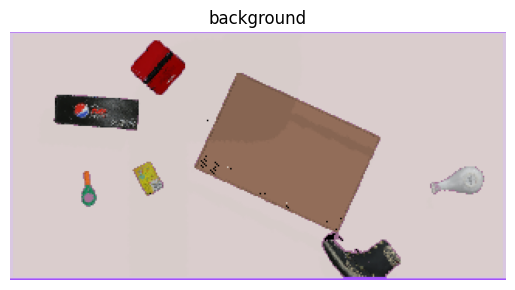

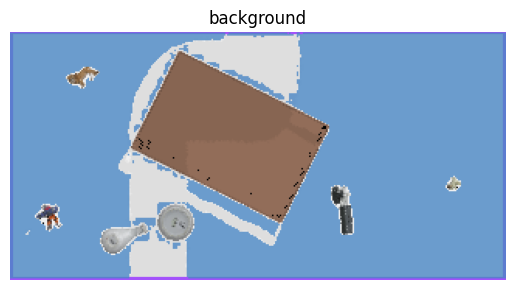

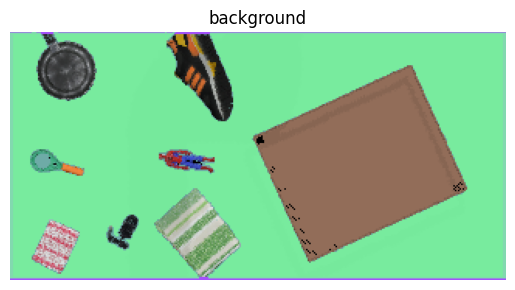

...

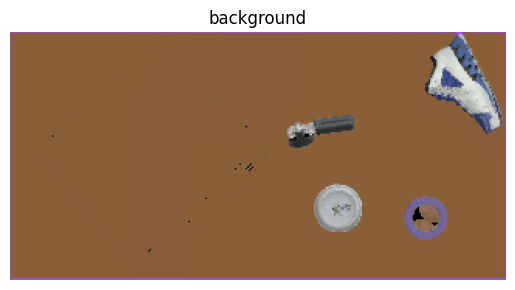

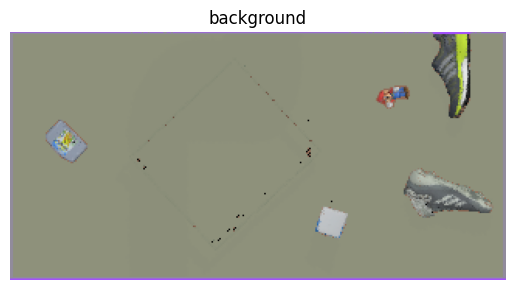

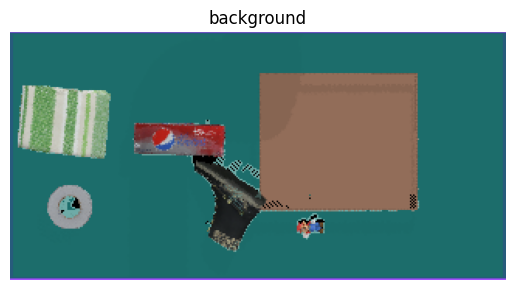

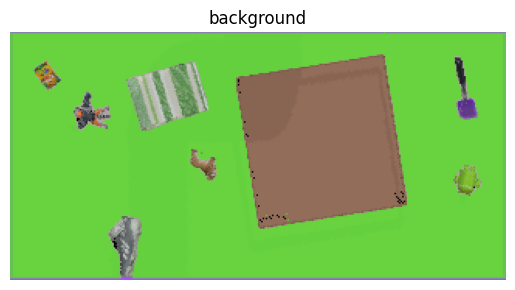

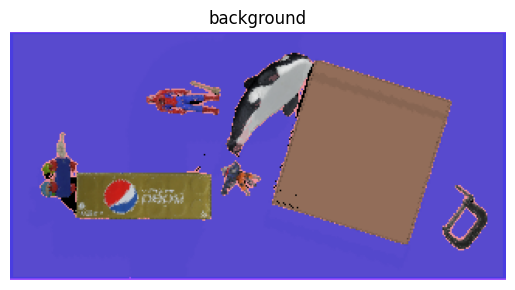

GSAM could not detect objects in 0 images


In [ ]:
# @title Load Raw Images and Prepare Masks

# From metadata, get image and object to detect
# Metadata needs to store relative paths
df = pd.read_csv(metadata_path)
# Filter the DataFrame based on the condition
fail_rows = df[df['success'] == False]

raw_images = [os.path.join(raw_images_dir, raw_image) for raw_image in sorted(os.listdir(raw_images_dir))]

# Store processed data in a dictionary for each image
image_data_list = []
non_detected_count = 0

for index, row in fail_rows.iterrows():
    img_path = raw_images[index]
    object_name = row['object_name']
    GSAM_prompt = 'background'# object_name

    # Load images
    image_source, image = load_image(img_path)
    image_source_pil = Image.fromarray(image_source)

    # Detect
    annotated_frame, detected_boxes = detect(image, image_source, text_prompt=GSAM_prompt, model=groundingdino_model)

    # Skip if not detected
    if detected_boxes is None:
        non_detected_count += 1
        continue

    # Segment
    segmented_frame_masks = segment(image_source, sam_predictor, boxes=detected_boxes)
    annotated_frame_with_mask = draw_mask(segmented_frame_masks[0][0], annotated_frame)

    # display annotated_frame_with_mask
    plt.imshow(annotated_frame_with_mask)
    plt.title(GSAM_prompt)
    plt.axis('off')  # Turn off axes
    plt.show()

    # Create mask from segmentation
    mask = merge_masks(segmented_frame_masks)

    # Convert the detected_boxes from normalized coordinates to pixel coordinates
    image_width, image_height = image_source.shape[1], image_source.shape[0]
    detected_boxes_pixel_coords = [normalized_to_pixel_coordinates(box.squeeze().tolist(), image_width, image_height) for box in detected_boxes]

    # Extract the detected frame
    mask_frames = [Image.fromarray(get_image_inside_boundingbox(mask, box)) for box in detected_boxes_pixel_coords]
    image_frames = [Image.fromarray(get_image_inside_boundingbox(image_source, box)) for box in detected_boxes_pixel_coords]

    # Store processed data in a dictionary
    image_data = {
        'raw_image_path': img_path,
        'object_name': object_name,
        'image_source_pil': image_source_pil,
        'image_mask_np': mask,
        'detected_boxes_pixel_coords': detected_boxes_pixel_coords,
        'mask_frames': mask_frames,
        'image_frames': image_frames
    }
    image_data_list.append(image_data)

# Now you have the processed data for each image in the image_data_list
# You can access the processed data for each image using the dictionary keys
print(f'GSAM could not detect objects in {non_detected_count} images')

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10001_pepsi_gold_caffeine_free_box/0.png


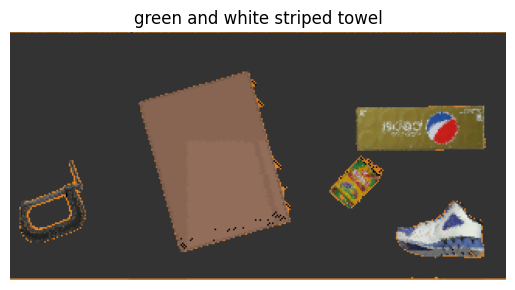

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10003_rhino_figure/0.png


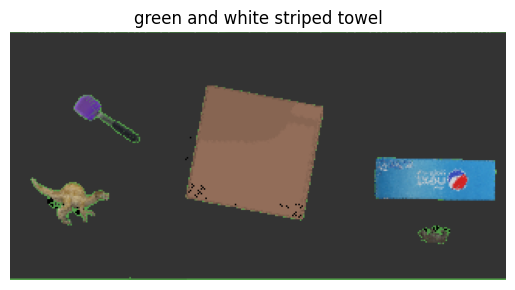

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10005_pepsi_max_box/0.png


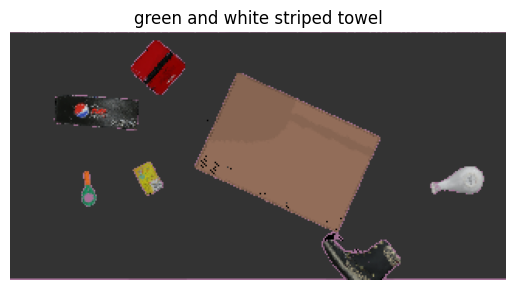

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10007_porcelain_cup/0.png


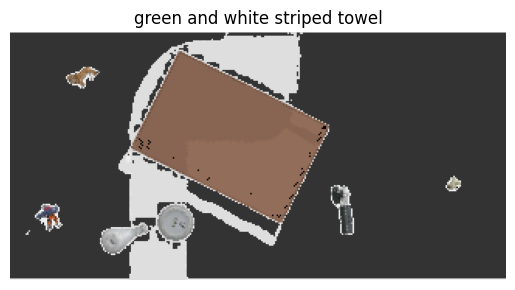

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10009_spiderman_figure/0.png


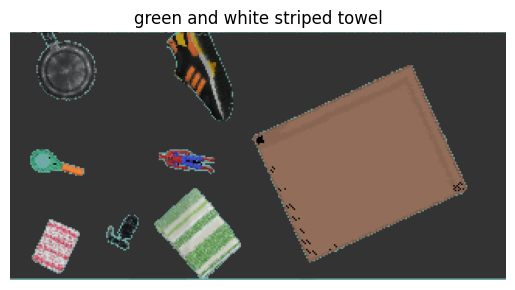

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10011_tablet/0.png


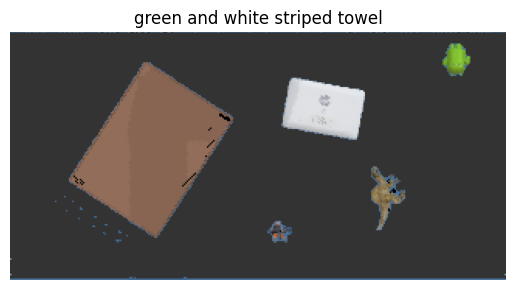

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10013_c_clamp/0.png


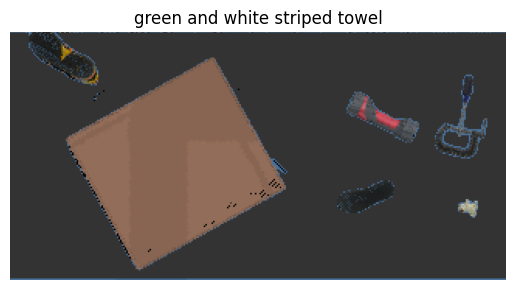

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10017_frypan/0.png


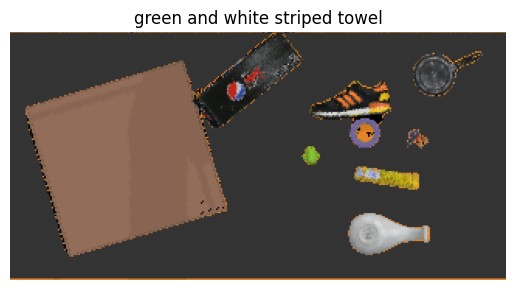

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10019_alarm_clock/0.png


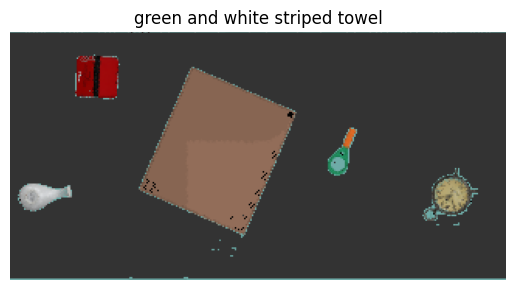

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10021_black_boot_with_leopard_print/0.png


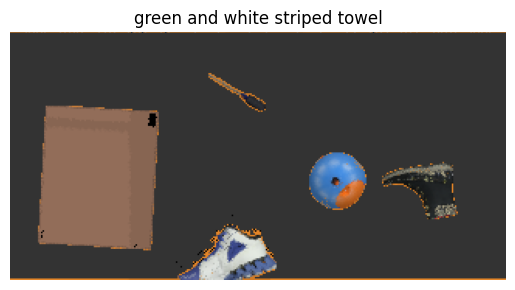

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10023_mario_figure/0.png


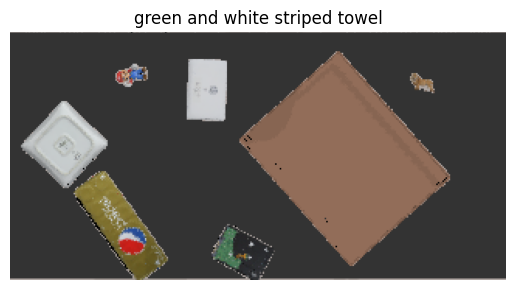

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10025_spatula_with_purple_head/0.png


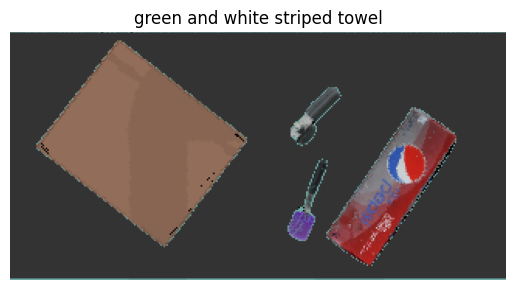

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10027_yoshi_figure/0.png


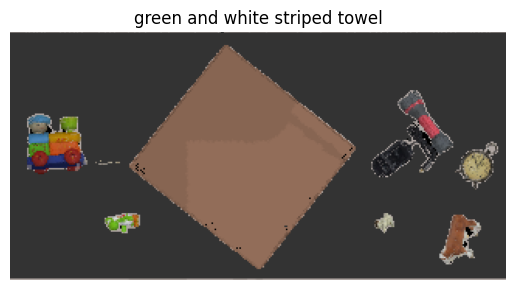

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10029_orca_plush_toy/0.png


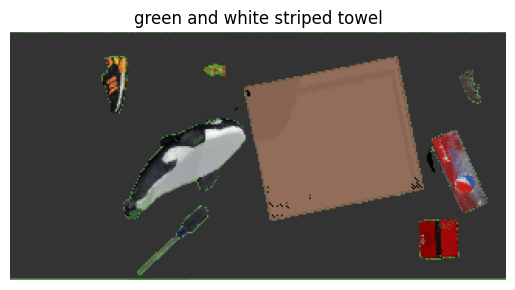

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10031_bull_figure/0.png


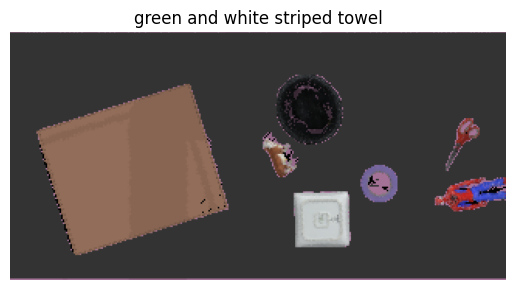

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10033_dog_statue/0.png


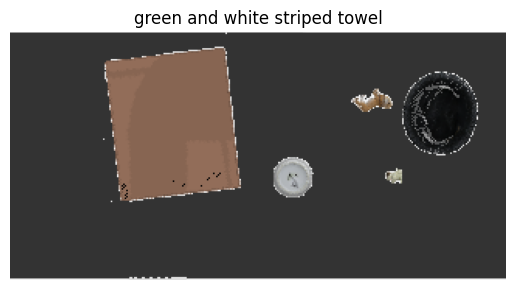

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10035_alarm_clock/0.png


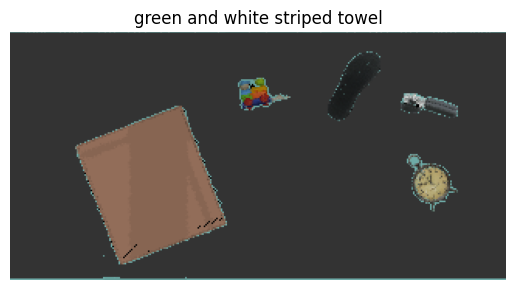

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10037_nintendo_3ds/0.png


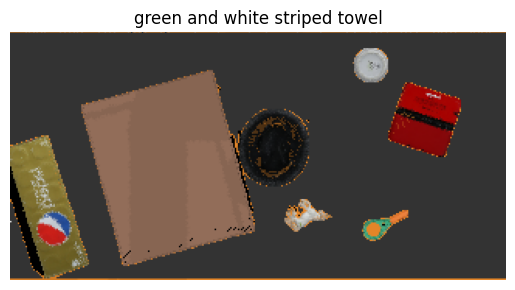

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10039_scissors/0.png


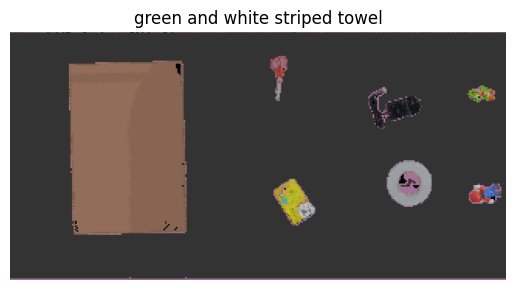

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10041_black_shoe_with_green_stripes/0.png


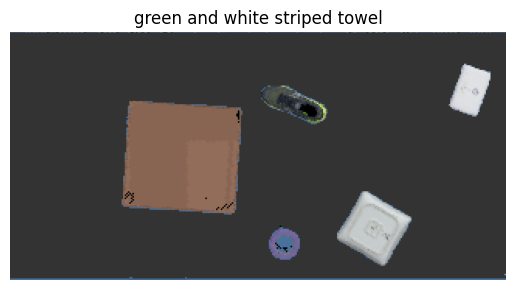

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10043_black_and_blue_sneakers/0.png


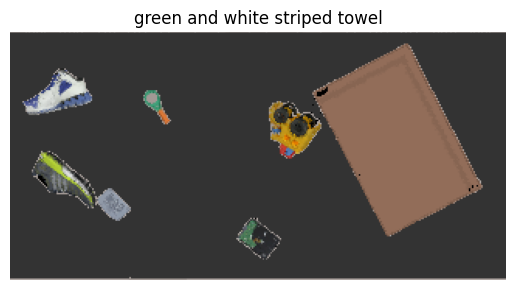

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10047_screwdriver/0.png


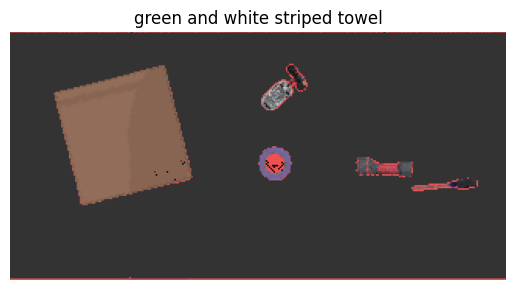

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10049_hammer/0.png


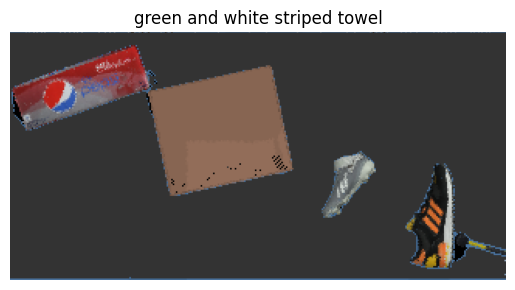

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10051_android_toy/0.png


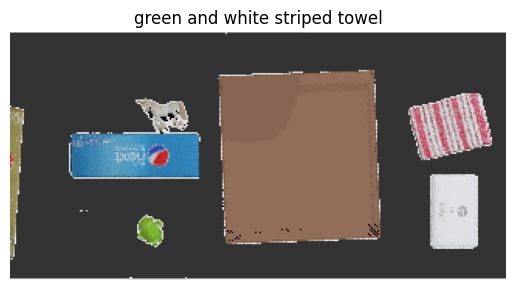

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10053_mario_figure/0.png


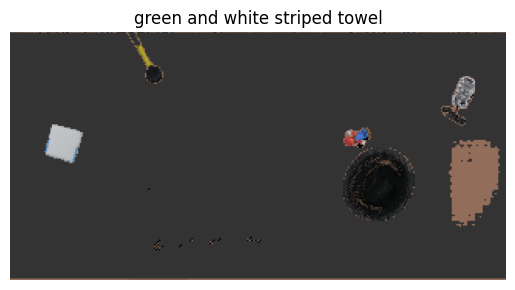

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10055_pepsi_next_box/0.png


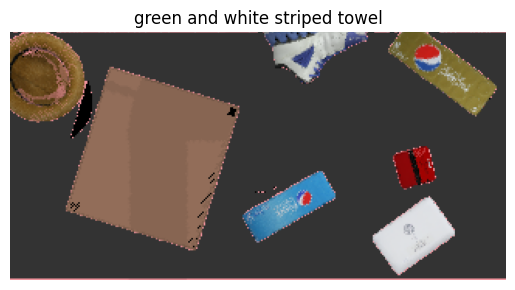

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10057_red_cup/0.png


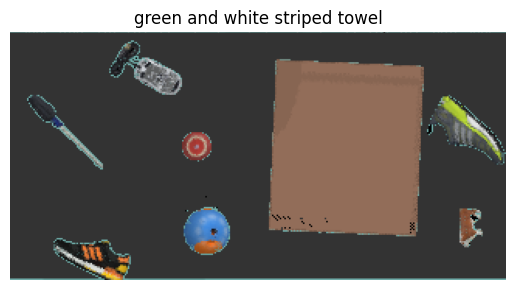

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10059_lion_figure/0.png


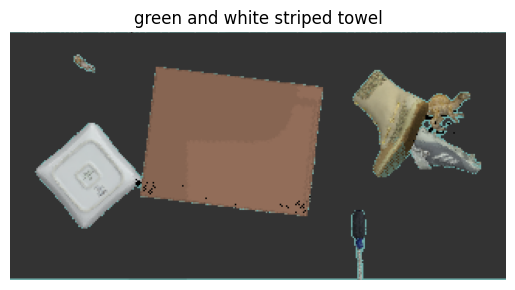

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10061_dog_statue/0.png


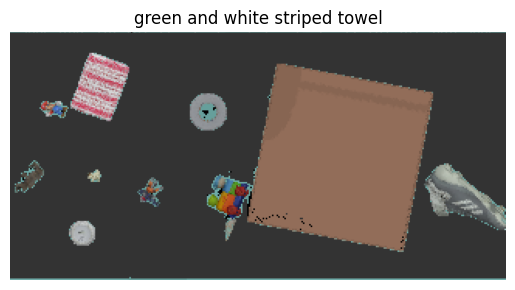

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10063_magnifying_glass/0.png


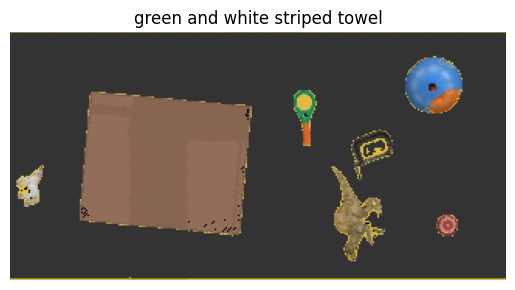

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10065_black_fedora/0.png


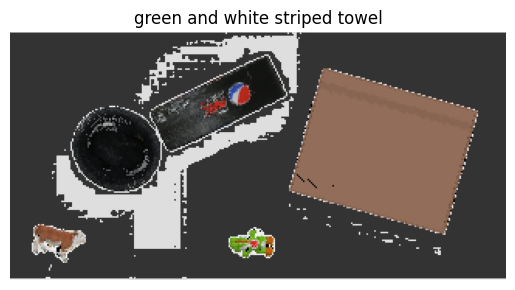

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10067_hammer/0.png


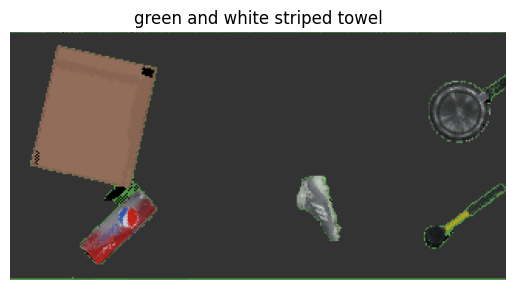

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10071_mario_figure/0.png


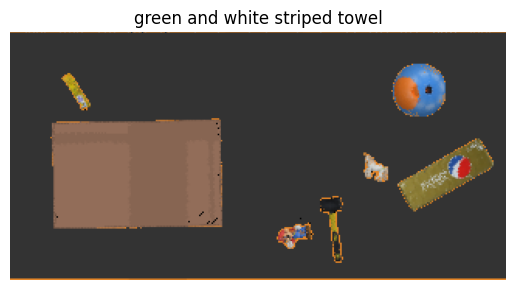

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10073_orca_plush_toy/0.png


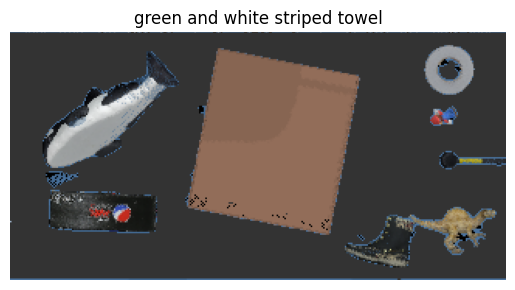

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10075_tablet/0.png


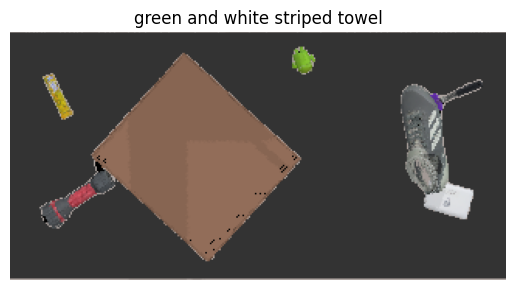

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10077_butterfinger_chocolate/0.png


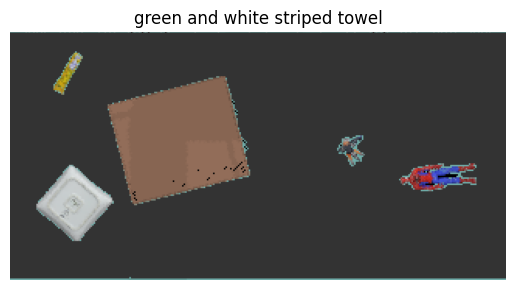

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10079_black_shoe_with_orange_stripes/0.png


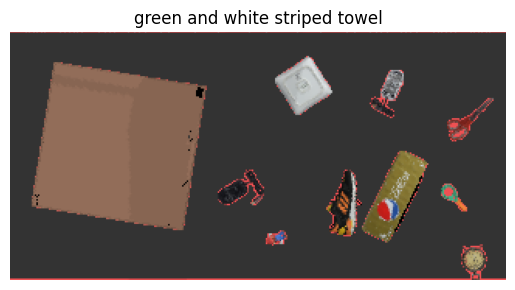

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10081_brown_fedora/0.png


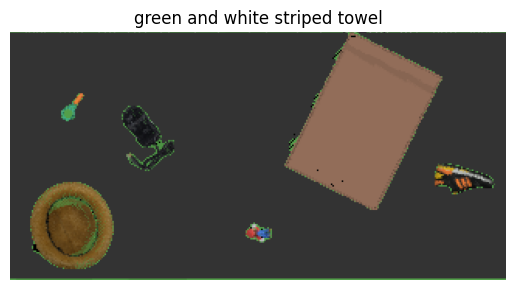

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10083_black_boot_with_leopard_print/0.png


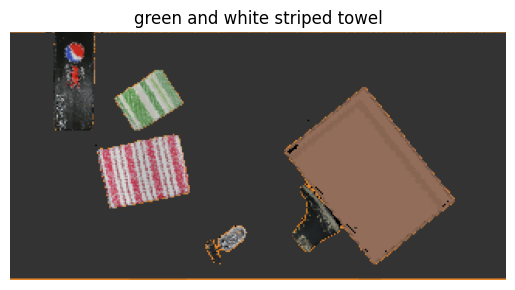

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10085_screwdriver/0.png


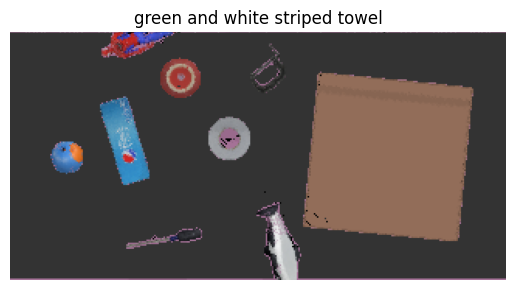

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10087_hard_drive/0.png


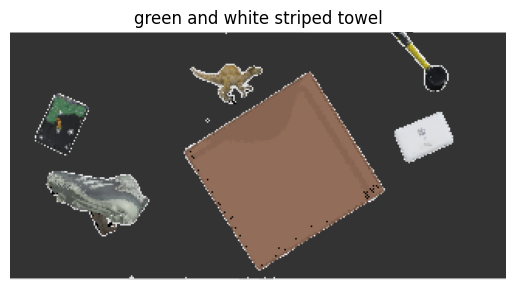

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10089_unicorn_toy/0.png


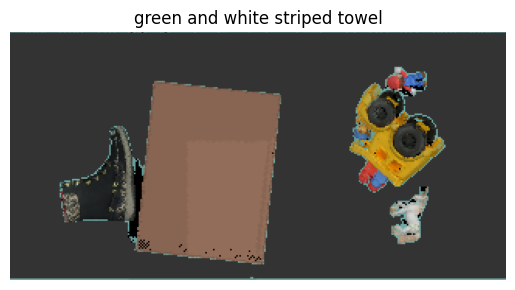

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10091_dinosaur_figure/0.png


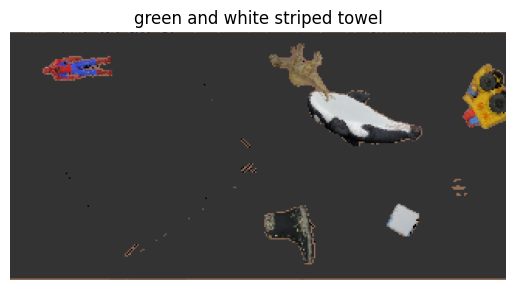

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10093_honey_dipper/0.png


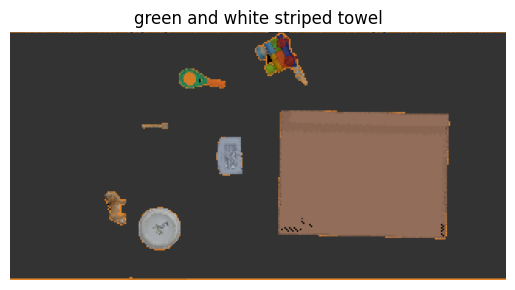

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10095_pepsi_max_box/0.png


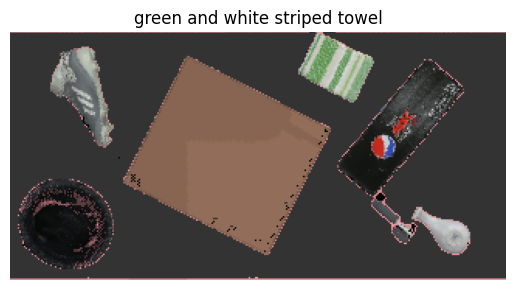

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10097_purple_tape/0.png


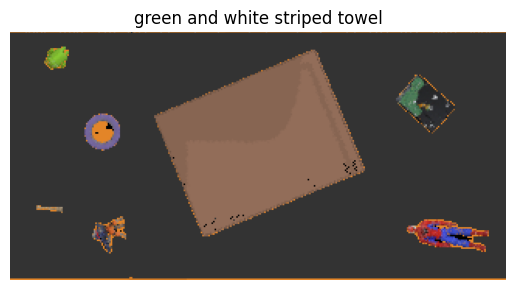

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10099_rhino_figure/0.png


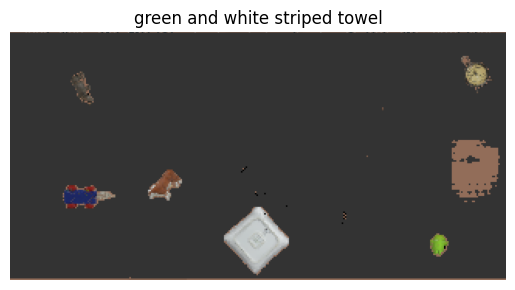

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10101_alarm_clock/0.png


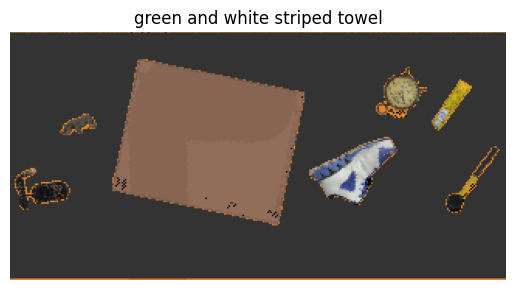

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10105_ball_puzzle/0.png


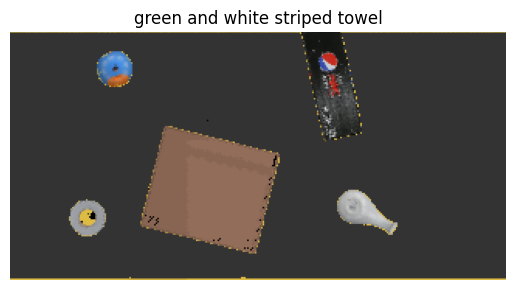

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10107_red_and_white_striped_towel/0.png


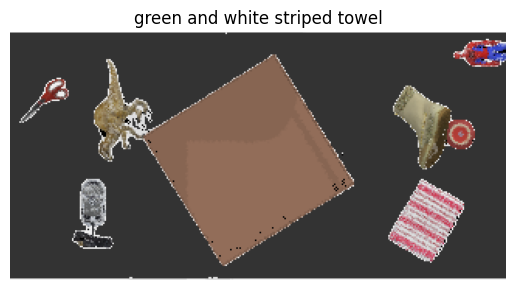

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10109_black_and_blue_sneakers/0.png


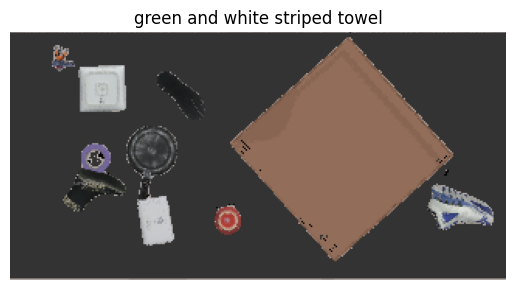

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10111_hard_drive/0.png


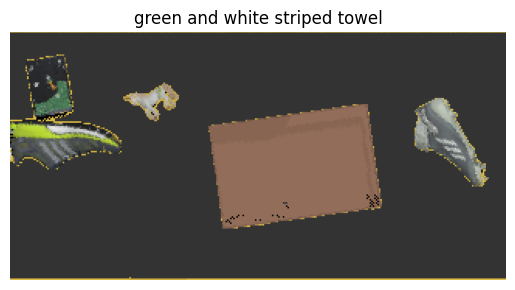

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10113_scissors/0.png


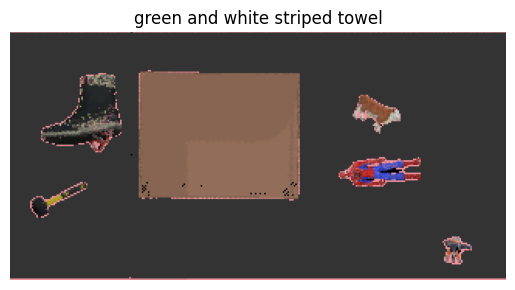

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10115_pepsi_wild_cherry_box/0.png


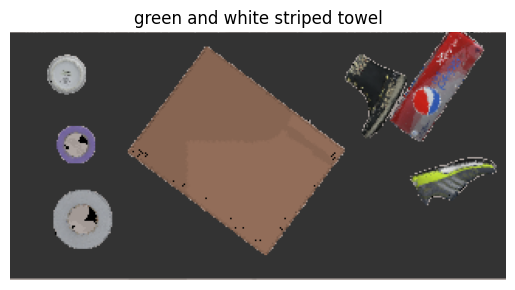

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10117_black_sandal/0.png


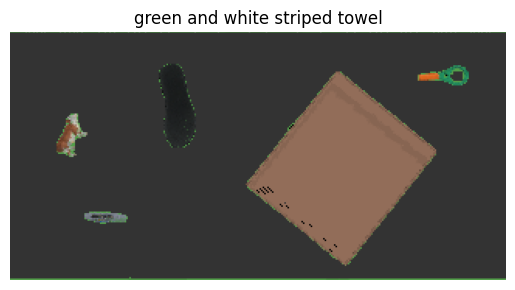

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10119_screwdriver/0.png


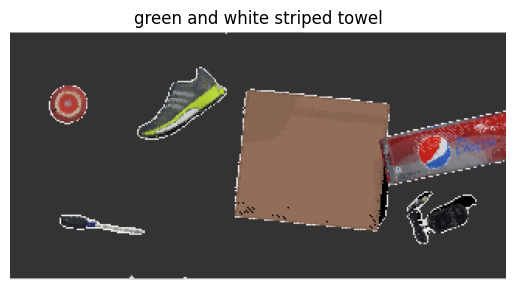

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10121_rocket_racoon_figure/0.png


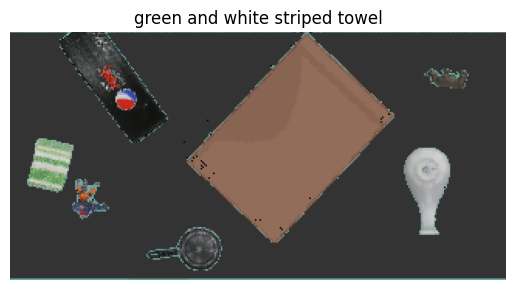

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10123_spatula_with_purple_head/0.png


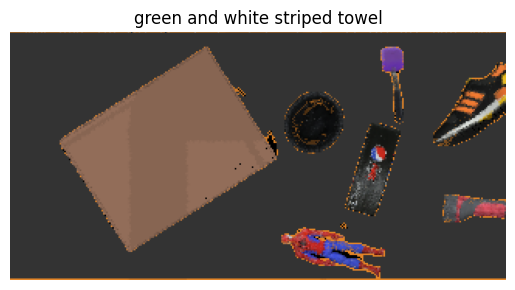

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10125_screwdriver/0.png


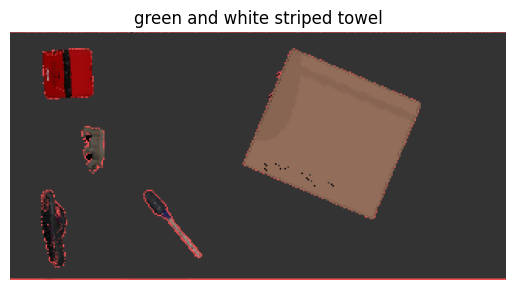

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10127_orca_plush_toy/0.png


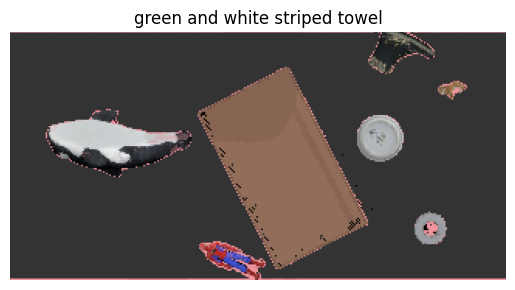

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10129_purple_tape/0.png


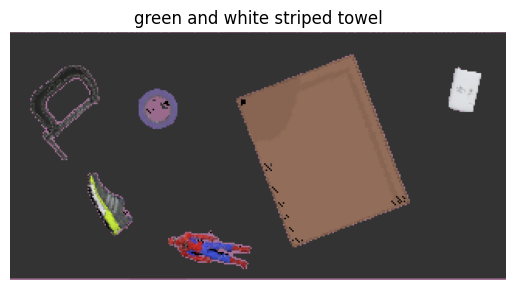

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10131_bull_figure/0.png


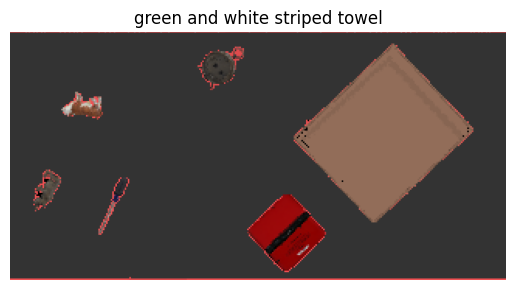

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10133_android_toy/0.png


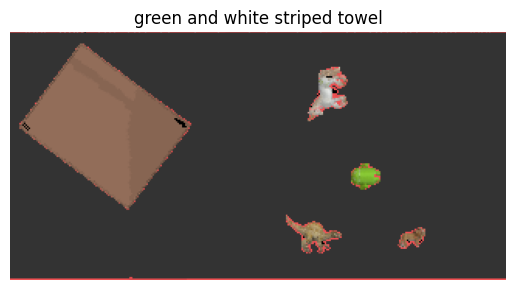

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10135_grey_soccer_shoe_with_cleats/0.png


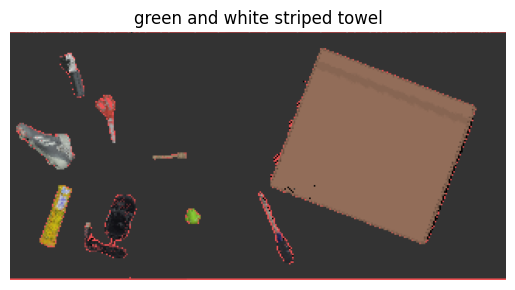

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10137_light_brown_boot_with_golden_laces/0.png


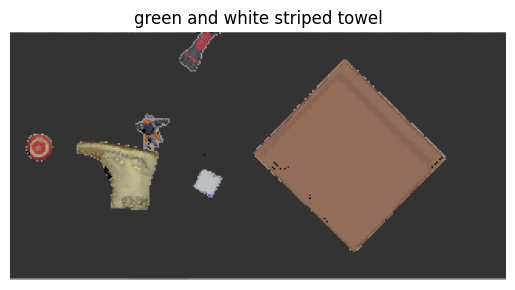

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10139_scissors/0.png


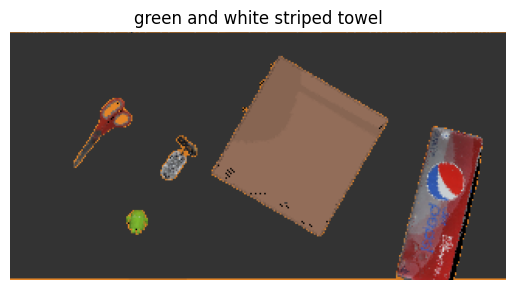

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10141_dog_statue/0.png


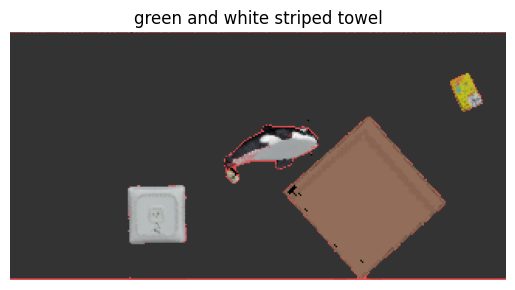

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10143_hammer/0.png


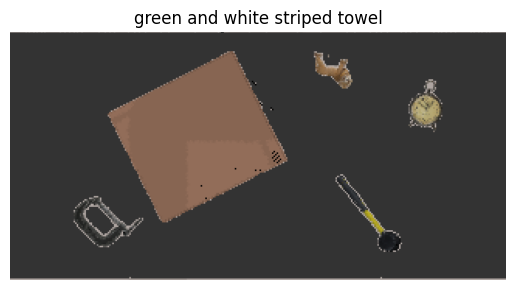

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10145_screwdriver/0.png


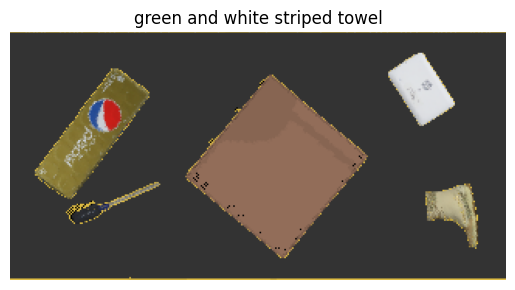

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10147_brown_fedora/0.png


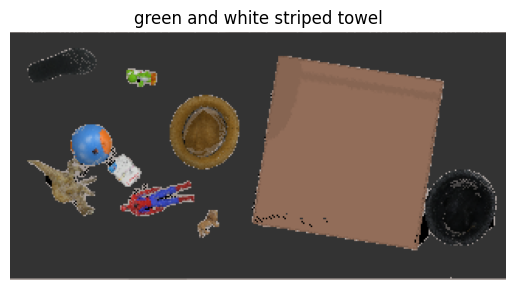

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10151_black_sandal/0.png


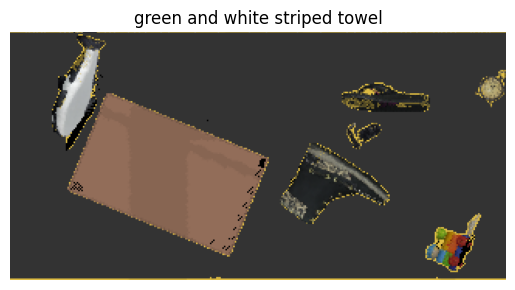

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10155_rhino_figure/0.png


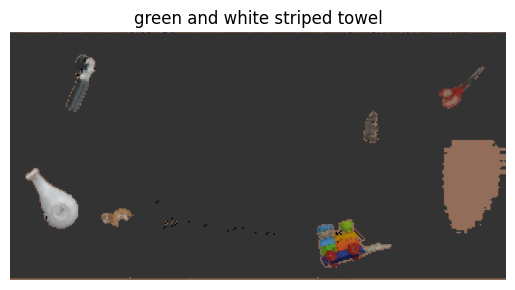

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10157_black_razer_mouse/0.png


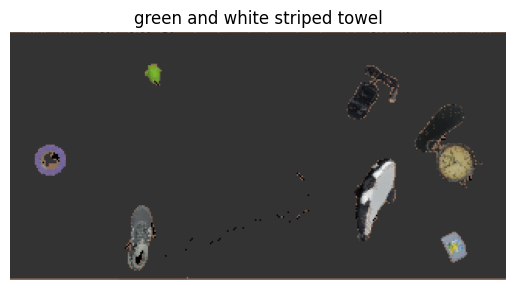

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10161_frypan/0.png


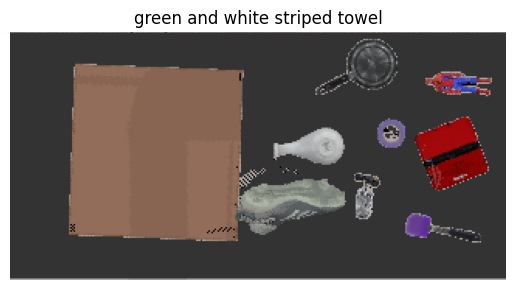

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10163_butterfinger_chocolate/0.png


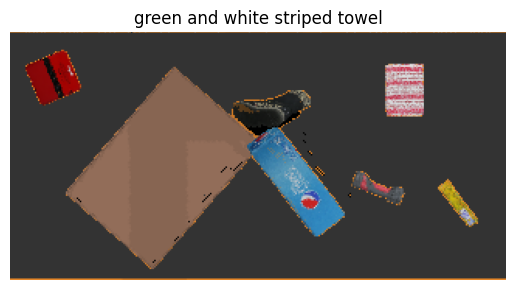

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10165_hard_drive/0.png


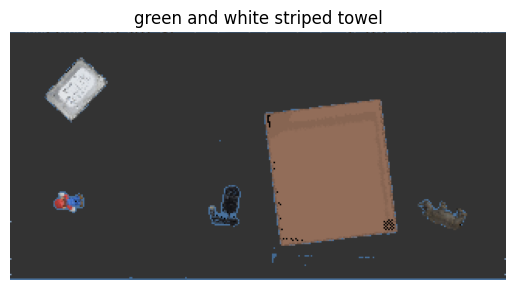

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10167_red_cup/0.png


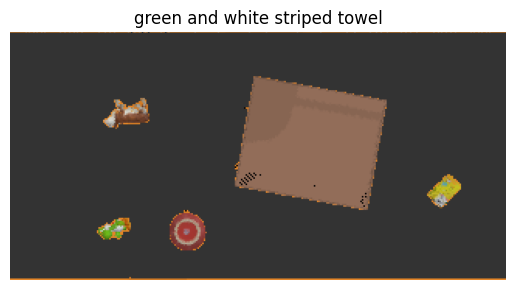

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10171_crayon_box/0.png


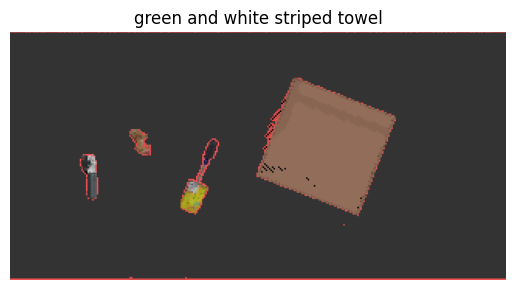

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10175_android_toy/0.png


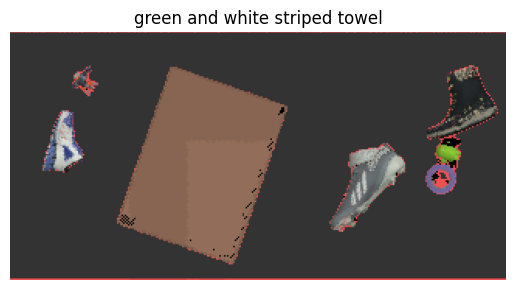

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10177_pepsi_max_box/0.png


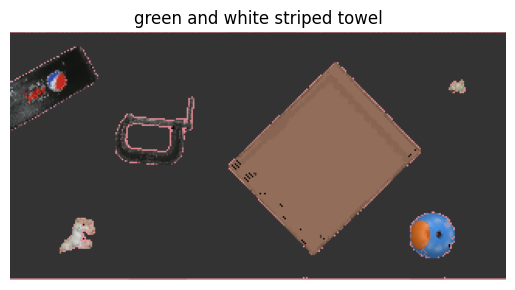

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10181_android_toy/0.png


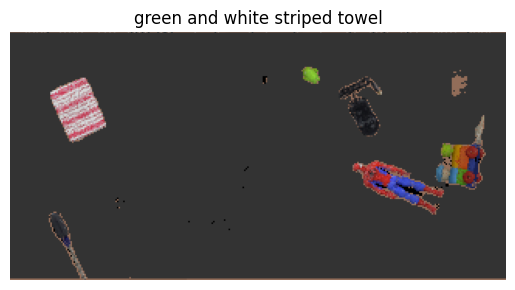

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10183_black_shoe_with_orange_stripes/0.png


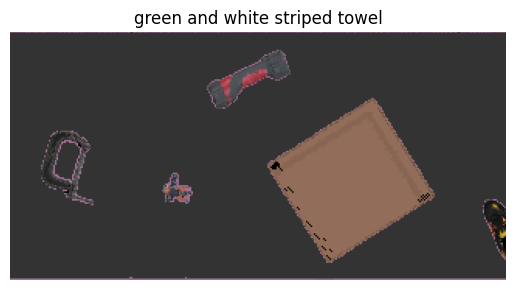

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10187_dog_statue/0.png


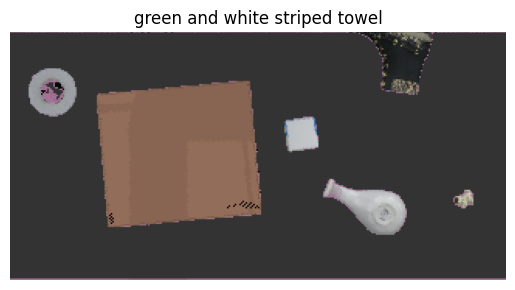

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10189_office_depot_box/0.png


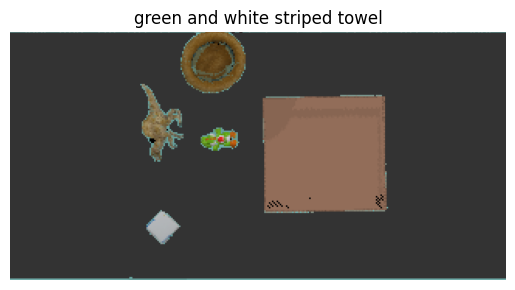

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10191_toy_school_bus/0.png


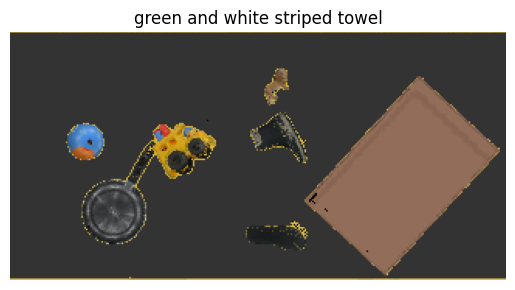

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10193_brown_fedora/0.png


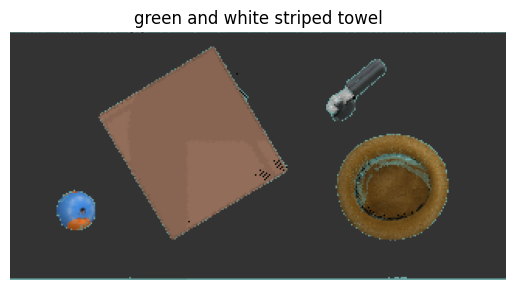

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10195_black_and_blue_sneakers/0.png


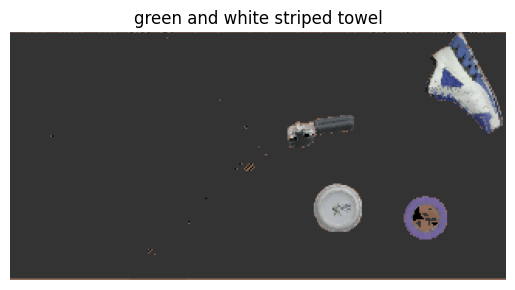

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10197_grey_soccer_shoe_with_cleats/0.png


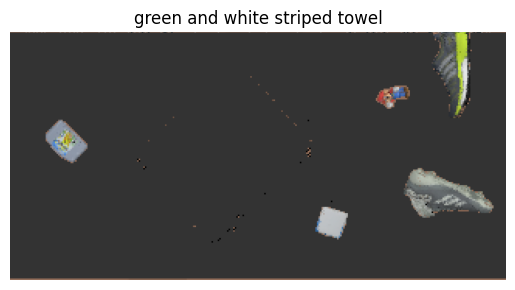

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10201_pepsi_wild_cherry_box/0.png


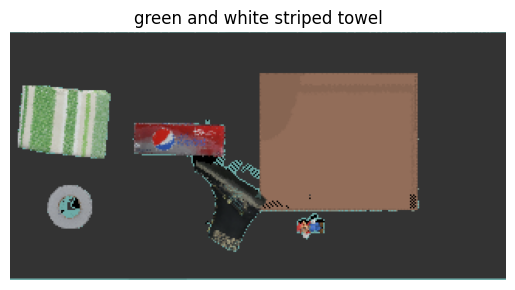

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10203_rocket_racoon_figure/0.png


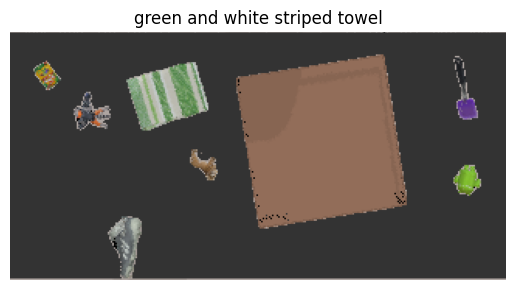

/content/drive/MyDrive/ROSO/data/packing-seen-google-object-test/edited_images/10205_toy_train/0.png


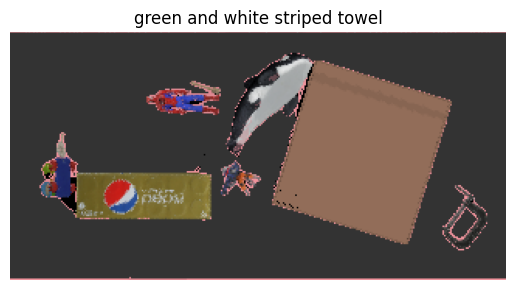

In [ ]:
# @title Change the Background Color

# Define the Darkgrey color
darkgrey_color = (51, 51, 51)  # RGB values for "0.2 0.2 0.2"

# Iterate through the list of image_data_list
for i, image_data in enumerate(image_data_list):
    # Load data from image_data
    raw_image_path = image_data['raw_image_path']
    detected_boxes_pixel_coords = image_data['detected_boxes_pixel_coords']
    image_source_pil = image_data['image_source_pil']
    image_mask_np = image_data['image_mask_np']
    image_frames_pil = image_data['image_frames']
    mask_frames_pil = image_data['mask_frames']
    object_name = image_data['object_name']
    object_name = 'green and white striped towel'  # Variant of the experiment. Comment it for unseen obj to seen obj editing

    # Convert the images to NumPy arrays for easier pixel manipulation
    image_source_np = np.array(image_source_pil)

    # Apply the Darkgrey color to the selected pixels
    image_source_np[image_mask_np] = darkgrey_color

    # Convert the modified NumPy array back to a PIL image
    edited_image_pil = Image.fromarray(image_source_np)

    # Save edited image
    filename_without_extension = os.path.splitext(os.path.basename(raw_image_path))[0]
    save_path = os.path.join(store_dir, filename_without_extension, str(0) + '.png')
    print(save_path)
    edited_image_pil.save(save_path)

    # Display the image
    plt.imshow(edited_image_pil)
    plt.title(object_name)
    plt.axis('off')  # Turn off axes
    plt.show()

# Now, the pixel values in image_source_pil have been changed to Darkgrey where the mask is active.
